In [1]:
import numpy as np
import pprint as pp

from os import listdir
from os.path import isfile, join
from datetime import datetime

import os
import xml.etree.ElementTree as ET
from sklearn.metrics import average_precision_score
import time

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import random_split

import torchvision.models as models
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchvision.transforms import FiveCrop, ToTensor, Lambda, Compose, CenterCrop, Normalize

import matplotlib.pyplot as plt

from utils import PascalVOCLabelLoader, PascalVOCDataset, ImageOnlyDataset


In [2]:
def train_epoch(model, device, train_loader, optimizer, num_epochs, val_loader, loss_fun, class_list):
    train_losses = []
    train_ap_scores = []
    val_losses = []
    val_ap_scores = []
    
    now = datetime.now()
    directory = 'model_' + now.strftime("%m%d%Y_%H%M%S")
    if not os.path.exists(directory):
        os.makedirs(directory)

    for epoch in range(1, num_epochs + 1):
        print(f'\nEpoch: {epoch}')
        train_loss, train_ap_score = train(model, device, train_loader, optimizer, epoch, loss_fun, class_list)
        val_loss, val_ap_score = validate(model, device, val_loader, epoch, loss_fun, class_list)

        if (len(val_losses) > 0) and (val_loss < min(val_losses)):
            torch.save(model.state_dict(), directory + f'/resnet18_model_{epoch}.pt')
            print(f"Saving model (epoch {epoch}) with lowest validation loss: {val_loss}")

        train_losses.append(train_loss)
        train_ap_scores.append(train_ap_score)
        val_losses.append(val_loss)
        val_ap_scores.append(val_ap_score)

    print("Training and validation complete.")
    return train_losses, train_ap_scores, val_losses, val_ap_scores

In [3]:
def train(model, device, train_loader, optimizer, epoch, loss_fun, class_list):
    model.train()
    train_losses = []
    ap_score = 0
    
    for idx, batch in enumerate(train_loader):
        data = batch[0].to(device)
        target = batch[1].to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = loss_fun(output, target)
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())
        pred = torch.sigmoid(output)
        
        if idx == 0:
            predictions = pred
            targets = target
        else:
            predictions = torch.cat((predictions, pred))
            targets = torch.cat((targets, target))
        if idx % 100 == 0:
            print(f'Epoch: {epoch}, Training_Samples: {idx}/{len(train_loader)}, Loss: {loss.item()},\
            Total AP: {ap(targets, predictions.detach(), len(class_list)):.4f}')
    
    train_loss = torch.mean(torch.tensor(train_losses))
    total_ap_score = ap(targets, predictions.detach(), len(class_list))
    classwise_ap_scores = classwise_ap(targets, predictions.detach(), class_list)
    mean_ap_score = np.mean([ 0 if np.isnan(i) else i for i in list(classwise_ap_scores.values())])
    
    print(f'Training set: Average loss: {train_loss:.4f}, Total AP: {total_ap_score:.4f}')
    print('Validation set: Classwise AP:')
    pp.pprint(classwise_ap_scores)
    print(f'Validation set: Mean AP: {mean_ap_score:.4f})')
    return train_loss, mean_ap_score

In [4]:
def validate(model, device, val_loader, epoch, loss_fun, class_list):
    model.eval()
    val_loss = 0
    ap_score = 0
    
    with torch.no_grad():
        for idx, batch in enumerate(val_loader):
            data = batch[0].to(device)
            target = batch[1].to(device)
            output = model(data)
            
            # compute the batch loss
            batch_loss = loss_fun(output, target).item()
            val_loss += batch_loss
            pred = torch.sigmoid(output)
            
            if idx == 0:
                predictions = pred
                targets = target
            else:
                predictions = torch.cat((predictions, pred))
                targets = torch.cat((targets, target))
            if idx % 100 == 0:
                print(f'Epoch: {epoch}, Validation_Samples: {idx}/{len(val_loader)}, Loss: {batch_loss},\
                Total AP: {ap(targets, predictions, len(class_list)):.4f}')
                

    val_loss /= len(val_loader)
    total_ap_score = ap(targets, predictions, len(class_list))
    classwise_ap_scores = classwise_ap(targets, predictions, class_list)
    mean_ap_score = np.mean([ 0 if np.isnan(i) else i for i in list(classwise_ap_scores.values())])
    
    print(f'Validation set: Average loss: {val_loss:.4f}, Total AP: {total_ap_score:.4f}')
    print('Validation set: Classwise AP:')
    pp.pprint(classwise_ap_scores)
    print(f'Validation set: Mean AP: {mean_ap_score:.4f})')
    
    return val_loss, mean_ap_score

In [5]:
def test(model, device, test_loader, loss_fun, class_list):
    model.eval()
    test_loss = 0
    ap_score = 0
    
    with torch.no_grad():
        for idx, batch in enumerate(test_loader):
            data = batch[0].to(device)
            target = batch[1].to(device)
            output = model(data)
            
            # compute the batch loss
            batch_loss = loss_fun(output, target).item()
            test_loss += batch_loss
            pred = torch.sigmoid(output)
            
            if idx == 0:
                predictions = pred
                targets = target
                image_paths = list(batch[2])
            else:
                predictions = torch.cat((predictions, pred))
                targets = torch.cat((targets, target))
                image_paths += list(batch[2])
            if idx % 100 == 0:
                print(f'Test_Samples: {idx}/{len(test_loader)}, Loss: {batch_loss},\
                Total AP: {ap(targets, predictions, len(class_list)):.4f}')
                

    test_loss /= len(test_loader)
    total_ap_score = ap(targets, predictions, len(class_list))
    classwise_ap_scores = classwise_ap(targets, predictions, class_list)
    mean_ap_score = np.mean([ 0 if np.isnan(i) else i for i in list(classwise_ap_scores.values())])
    
    print(f'Test set: Average loss: {test_loss:.4f}, Total AP: {total_ap_score:.4f}')
    print('Test set: Classwise AP:')
    pp.pprint(classwise_ap_scores)
    print(f'Test set: Mean AP: {mean_ap_score:.4f})')
    
    return predictions, targets, image_paths

In [6]:
def ap(targets, predictions, num_classes):
    return average_precision_score(targets.reshape(-1, num_classes).cpu(), predictions.reshape(-1, num_classes).cpu())

In [7]:
def classwise_ap(targets, predictions, class_list):
    classwise_ap_dic = {}
    for i, label in enumerate(class_list):
        classwise_ap_dic[label] = average_precision_score(targets[:, i].cpu(),  predictions[:, i].cpu())
    return classwise_ap_dic

In [8]:
def top_bot_scores_50(img_names, scores, class_num, top=50):
    """
    img_names: a list containing the image names
    scores: a list containing the predicted scores for each class
    class_num: the column of the class
    num_ins: number of instances you want
    
    returns: a list containing the top and bottom 50 scores and images of this class in the format
             [top_50_scores, top_50_images, bot_50_scores, bot_50_images]
    
    """

    # Use the scores to get the new order in a list, from highest to lowest
    n_scores = np.copy(scores.cpu())
    n_img_names = np.copy(img_names)
    
    reorder = n_scores[:,class_num].argsort()[::-1]
    # Reorder the img_names
    r_img_names = n_img_names[reorder]
    top_img = r_img_names[:top]
    bottom_img = r_img_names[-top:]
    
    return top_img, bottom_img, reorder

In [9]:
def img_grid_plotter(dataloader, device, class_name, num_img, rank_name):
    real_batch = next(iter(dataloader))
    plt.figure(figsize=(20,10))
    plt.axis("off")
    plt.title(f'Top {num_img} {rank_name} scored images for class {class_name}')
    plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:50], padding=2, nrow=10, normalize=True).cpu(),(1,2,0)))

In [10]:
# Create dataloaders for top and bot images
def plot_top_images(cls_img_pairs, device, img_path, tr, class_list, rank_name):
    """
    cls_img_pairs: a list containing the pairs of a class with its respective top or bottom x image names
    img_path: image path
    tr: your transform sequence
    class_list: a list mapping for the class labels
    rank_name: determine if the set is either highest or lowest
    
    returns Nothing, but plots out the random 5 classes and their top/bottom x images
    """
    for x in cls_img_pairs:
        num_img = len(x[1])
        # Create the dataset and subsequently dataloader
        i_dataset = ImageOnlyDataset(img_path, x[1], transform=tr)
        i_dataloder = DataLoader(i_dataset, batch_size=num_img, shuffle=False)
        
        
        # Use plotter function to print a grid of the images
        img_grid_plotter(i_dataloder, device, class_list[x[0]], num_img, rank_name)
    
    

In [11]:
def get_tail_acc(sorted_predictions, sorted_targets, t_min, t_max, t_num, t_vals):
    tail_acc_list = []
    for t_val in t_vals:
        tp = 0
        fp = 0
        for (prediction, target) in zip(sorted_predictions, sorted_targets):
            pred = 0
            if prediction > t_val:
                pred = 1
                if pred == target:
                    tp += 1
                else:
                    fp += 1
        tail_acc = 0
        if tp+fp > 0:
            tail_acc = tp/(tp+fp)
        tail_acc_list.append(tail_acc)
        
    return tail_acc_list

In [12]:
def run():

    ###### Global Variables (Change it if you want) ######
    class_list = ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 
                  'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')    
    lr = 1e-3
    momentum = 0.9
    imgpath = 'data/VOCdevkit/VOC2012/JPEGImages/'
    voc_path = 'data/VOCdevkit/VOC2012'
    rand_crop_size = 300
    bs = 16 # Batch size not bullshit
    epochs = 20
    torch.manual_seed(7)

    rgb_mean = [0.4589, 0.4355, 0.4032]
    rgb_std = [0.2239, 0.2186, 0.2206]
    
    tr = transforms.Compose([transforms.RandomResizedCrop(rand_crop_size),
                                 transforms.ToTensor(),
                                 transforms.Normalize(rgb_mean, rgb_std)])

    ###### Create datasets and respective dataloaders ######
    pvc = PascalVOCLabelLoader(voc_path)

    train_dataset = PascalVOCDataset(imgpath, class_list, pvc, 'train', transform=tr)
    train_loader = DataLoader(train_dataset, batch_size=bs, shuffle=True)

    val_dataset = PascalVOCDataset(imgpath, class_list, pvc, 'trainval', transform=tr)
    val_loader = DataLoader(val_dataset, batch_size=bs, shuffle=True)

    test_dataset = PascalVOCDataset(imgpath, class_list, pvc, 'val', transform=tr)
    test_loader = DataLoader(test_dataset, batch_size=bs, shuffle=True)

    ###### Model Parameters ######
    model = models.resnet18(pretrained=True)
    model.fc = nn.Linear(512, len(class_list))
    model.to(device)
    optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum)
    loss_fun = nn.BCEWithLogitsLoss()

    ###### Start Taining ######
    start = time.time()
    train_losses, train_ap_scores, val_losses, val_ap_scores = train_epoch(model, device, train_loader, optimizer, epochs, val_loader, loss_fun, class_list)
    print(f'Total training time taken: {time.time() - start}')

    ###### Plot Loss and mean AP score of training and validation dataset ######
    plt.figure(figsize=(20,10))
    plt.subplot(121),
    plt.plot(train_losses, label = "Training Loss"),
    plt.plot(val_losses, label = "Validation Loss"),
    plt.title('Loss'),
    plt.legend(frameon = False)
    plt.subplot(122),
    plt.plot(train_ap_scores, label = "Training Mean AP Score"),
    plt.plot(val_ap_scores, label = "Validation Mean AP Score"),
    plt.title('Mean AP Score'),
    plt.legend(frameon = False)
    plt.show()

    ###### Run the test function and get the respective predictions, targets and impage paths ######
    test_predictions, test_targets, test_image_paths = test(model, device, test_loader, loss_fun, class_list)

    # Randomly pick 5 classes
    np.random.seed(10)
    random_classes = np.random.choice(range(len(class_list)), 5, replace=False)

    # Each of these contains 5 lists, that contain [class_number, [array of image_names]]
    t_images_all = []
    b_images_all = []

    # Store the sorted list of images based on scores with their respective class
    for x in random_classes:
        t_images, b_images, _ = top_bot_scores_50(test_image_paths, test_predictions, x)
        t_images_all.append([x, t_images])
        b_images_all.append([x, b_images])

    ###### Plot the top 50 highest and lowest images ######
    # Display top 50 images random 5 classes
    plot_top_images(t_images_all, device, imgpath, tr, class_list, "highest")

    # Display bottom 50 images random 5 classes
    plot_top_images(b_images_all, device, imgpath, tr, class_list, "lowest")

    # Define variables for calculating tail accuracies
    tail_acc_classwise = []
    t_max = np.max(test_predictions.cpu().numpy())
    t_min=0.5
    t_num=20
    t_vals = np.linspace(t_min, t_max, t_num, endpoint=False)

    ###### Calculate Tail Accuracy for all classes ######
    for i in range(len(class_list)):
        _, _, reorder = top_bot_scores_50(test_image_paths, test_predictions, i)
        sorted_predictions = np.copy(test_predictions.cpu())[reorder]
        sorted_predictions = sorted_predictions[:50, i]
        sorted_targets = np.copy(test_targets.cpu())[reorder]
        sorted_targets = sorted_targets[:50, i]

        tail_acc_classwise.append(get_tail_acc(sorted_predictions, sorted_targets, t_min, t_max, t_num, t_vals))

    ###### Plot average tail accuracy of all classes ######
    avg_tail_acc = np.mean(tail_acc_classwise, axis=0)
    plt.figure(figsize=(20,10))
    plt.plot(t_vals, avg_tail_acc, 'b', t_vals, avg_tail_acc, 'ro')
    plt.xticks(t_vals)
    plt.title('Average of classwise tail accuraries over top-50 ranked images in each class')
    plt.ylabel('Tail Accuracy')
    plt.xlabel('t value')
    plt.show()


Epoch: 1


C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 1, Training_Samples: 0/358, Loss: 0.7458736044671177,            Total AP: nan
Epoch: 1, Training_Samples: 100/358, Loss: 0.21281604966968926,            Total AP: 0.0835
Epoch: 1, Training_Samples: 200/358, Loss: 0.20335707855756693,            Total AP: 0.0895
Epoch: 1, Training_Samples: 300/358, Loss: 0.23886087075797735,            Total AP: 0.0995
Training set: Average loss: 0.2572, Total AP: 0.1062
Validation set: Classwise AP:
{'aeroplane': 0.08208290036677694,
 'bicycle': 0.07799540614196421,
 'bird': 0.11172548763945672,
 'boat': 0.07817202287784034,
 'bottle': 0.060973675703284935,
 'bus': 0.05325141099213527,
 'car': 0.1491669051231127,
 'cat': 0.11946809013858238,
 'chair': 0.12969970151935772,
 'cow': 0.03753184497402477,
 'diningtable': 0.08190179703206088,
 'dog': 0.17635701764507286,
 'horse': 0.0432990684836469,
 'motorbike': 0.07249293617863242,
 'person': 0.5436049168114276,
 'pottedplant': 0.0534328447684808,
 'sheep': 0.038699889367185485,
 'sofa': 0.0458416

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 1, Validation_Samples: 0/722, Loss: 0.20716102523194985,                Total AP: nan
Epoch: 1, Validation_Samples: 100/722, Loss: 0.20308200733788503,                Total AP: 0.2831
Epoch: 1, Validation_Samples: 200/722, Loss: 0.21316092002200862,                Total AP: 0.2807
Epoch: 1, Validation_Samples: 300/722, Loss: 0.19325119036787097,                Total AP: 0.2832
Epoch: 1, Validation_Samples: 400/722, Loss: 0.20779830583320963,                Total AP: 0.2834
Epoch: 1, Validation_Samples: 500/722, Loss: 0.23690293908277243,                Total AP: 0.2817
Epoch: 1, Validation_Samples: 600/722, Loss: 0.21140281861555535,                Total AP: 0.2817
Epoch: 1, Validation_Samples: 700/722, Loss: 0.20092376153837435,                Total AP: 0.2829
Validation set: Average loss: 0.2050, Total AP: 0.2827
Validation set: Classwise AP:
{'aeroplane': 0.4659101636592425,
 'bicycle': 0.1949064187352215,
 'bird': 0.3758431111221592,
 'boat': 0.13006983265220295,
 'bottle': 

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 2, Training_Samples: 0/358, Loss: 0.2344671992162244,            Total AP: nan
Epoch: 2, Training_Samples: 100/358, Loss: 0.19355178217515673,            Total AP: 0.2993
Epoch: 2, Training_Samples: 200/358, Loss: 0.17745766267059143,            Total AP: 0.3228
Epoch: 2, Training_Samples: 300/358, Loss: 0.17259161790183591,            Total AP: 0.3432
Training set: Average loss: 0.1977, Total AP: 0.3526
Validation set: Classwise AP:
{'aeroplane': 0.6365791669227703,
 'bicycle': 0.29171215705205433,
 'bird': 0.47272864319687924,
 'boat': 0.24214166302770496,
 'bottle': 0.10494342291494424,
 'bus': 0.38824256892936637,
 'car': 0.5021985298959553,
 'cat': 0.6030711136011044,
 'chair': 0.4267185344197997,
 'cow': 0.16515381301971377,
 'diningtable': 0.281943118882322,
 'dog': 0.4960638190789585,
 'horse': 0.08298970490391638,
 'motorbike': 0.37690445330807093,
 'person': 0.8171708779416873,
 'pottedplant': 0.12643611995988852,
 'sheep': 0.11000482559136006,
 'sofa': 0.1467306390156

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 2, Validation_Samples: 0/722, Loss: 0.16778833289158138,                Total AP: nan
Epoch: 2, Validation_Samples: 100/722, Loss: 0.17435350874639685,                Total AP: 0.4589
Epoch: 2, Validation_Samples: 200/722, Loss: 0.20701385413678047,                Total AP: 0.4558
Epoch: 2, Validation_Samples: 300/722, Loss: 0.15359003968953328,                Total AP: 0.4601
Epoch: 2, Validation_Samples: 400/722, Loss: 0.157480239445573,                Total AP: 0.4602
Epoch: 2, Validation_Samples: 500/722, Loss: 0.19174456155009725,                Total AP: 0.4577
Epoch: 2, Validation_Samples: 600/722, Loss: 0.19517620142084235,                Total AP: 0.4541
Epoch: 2, Validation_Samples: 700/722, Loss: 0.17839068089047294,                Total AP: 0.4534
Validation set: Average loss: 0.1774, Total AP: 0.4537
Validation set: Classwise AP:
{'aeroplane': 0.7792206771530932,
 'bicycle': 0.4357179893931131,
 'bird': 0.6371295660414468,
 'boat': 0.4119185529955333,
 'bottle': 0.1

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 3, Training_Samples: 0/358, Loss: 0.17723909115728495,            Total AP: nan
Epoch: 3, Training_Samples: 100/358, Loss: 0.13904903160999246,            Total AP: 0.4293
Epoch: 3, Training_Samples: 200/358, Loss: 0.16567421215077616,            Total AP: 0.4513
Epoch: 3, Training_Samples: 300/358, Loss: 0.16936095520760305,            Total AP: 0.4609
Training set: Average loss: 0.1767, Total AP: 0.4623
Validation set: Classwise AP:
{'aeroplane': 0.7794101673323407,
 'bicycle': 0.4156309559896561,
 'bird': 0.634541867060083,
 'boat': 0.4776807554472778,
 'bottle': 0.17541404038601002,
 'bus': 0.5233274871627751,
 'car': 0.583668407411238,
 'cat': 0.7292426456957788,
 'chair': 0.4774110744908499,
 'cow': 0.25758513181182985,
 'diningtable': 0.3733977223213472,
 'dog': 0.5811140660528027,
 'horse': 0.27196645421840565,
 'motorbike': 0.5257628159353012,
 'person': 0.8619515973800699,
 'pottedplant': 0.16730637697778095,
 'sheep': 0.2247397299365207,
 'sofa': 0.20160166504734814,


C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 3, Validation_Samples: 0/722, Loss: 0.16292271605827932,                Total AP: nan
Epoch: 3, Validation_Samples: 100/722, Loss: 0.16790757028629522,                Total AP: 0.5303
Epoch: 3, Validation_Samples: 200/722, Loss: 0.1706774678142934,                Total AP: 0.5382
Epoch: 3, Validation_Samples: 300/722, Loss: 0.14239640722828217,                Total AP: 0.5361
Epoch: 3, Validation_Samples: 400/722, Loss: 0.16180632537128511,                Total AP: 0.5384
Epoch: 3, Validation_Samples: 500/722, Loss: 0.17233669374724228,                Total AP: 0.5390
Epoch: 3, Validation_Samples: 600/722, Loss: 0.1848545913233989,                Total AP: 0.5389
Epoch: 3, Validation_Samples: 700/722, Loss: 0.13952651234394792,                Total AP: 0.5382
Validation set: Average loss: 0.1589, Total AP: 0.5386
Validation set: Classwise AP:
{'aeroplane': 0.8664326315310263,
 'bicycle': 0.5167031780657952,
 'bird': 0.763023305315556,
 'boat': 0.5849883797861762,
 'bottle': 0.20

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 4, Training_Samples: 0/358, Loss: 0.19361359544360776,            Total AP: nan
Epoch: 4, Training_Samples: 100/358, Loss: 0.19696716405734147,            Total AP: 0.5241
Epoch: 4, Training_Samples: 200/358, Loss: 0.19488441166484896,            Total AP: 0.5293
Epoch: 4, Training_Samples: 300/358, Loss: 0.1717628177951719,            Total AP: 0.5323
Training set: Average loss: 0.1615, Total AP: 0.5320
Validation set: Classwise AP:
{'aeroplane': 0.8416687669915681,
 'bicycle': 0.5186410900542266,
 'bird': 0.7422042928946094,
 'boat': 0.6012903378948953,
 'bottle': 0.22726228337597087,
 'bus': 0.6569374470273934,
 'car': 0.5855227334402353,
 'cat': 0.7766294924965094,
 'chair': 0.5072795172979884,
 'cow': 0.24962372671670244,
 'diningtable': 0.43115287698330435,
 'dog': 0.6408920325630089,
 'horse': 0.4293027194797248,
 'motorbike': 0.5940735392742571,
 'person': 0.8726655360911262,
 'pottedplant': 0.21253008142042246,
 'sheep': 0.35193022921904094,
 'sofa': 0.2543627090028169,

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 4, Validation_Samples: 0/722, Loss: 0.13749001210365924,                Total AP: nan
Epoch: 4, Validation_Samples: 100/722, Loss: 0.17339492068904505,                Total AP: 0.5970
Epoch: 4, Validation_Samples: 200/722, Loss: 0.20528822723012333,                Total AP: 0.5916
Epoch: 4, Validation_Samples: 300/722, Loss: 0.12397309070727268,                Total AP: 0.5911
Epoch: 4, Validation_Samples: 400/722, Loss: 0.1261994432829412,                Total AP: 0.5956
Epoch: 4, Validation_Samples: 500/722, Loss: 0.10526637391802456,                Total AP: 0.5928
Epoch: 4, Validation_Samples: 600/722, Loss: 0.1574209334816119,                Total AP: 0.5907
Epoch: 4, Validation_Samples: 700/722, Loss: 0.13964479515520023,                Total AP: 0.5912
Validation set: Average loss: 0.1454, Total AP: 0.5917
Validation set: Classwise AP:
{'aeroplane': 0.8805812779757998,
 'bicycle': 0.5602136829075703,
 'bird': 0.8112628048269463,
 'boat': 0.6804631868017242,
 'bottle': 0.2

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 5, Training_Samples: 0/358, Loss: 0.15020128278565406,            Total AP: nan
Epoch: 5, Training_Samples: 100/358, Loss: 0.1554002627159915,            Total AP: 0.5479
Epoch: 5, Training_Samples: 200/358, Loss: 0.16263409148795918,            Total AP: 0.5584
Epoch: 5, Training_Samples: 300/358, Loss: 0.13221325970315048,            Total AP: 0.5617
Training set: Average loss: 0.1517, Total AP: 0.5678
Validation set: Classwise AP:
{'aeroplane': 0.8759146322598943,
 'bicycle': 0.5610082037594329,
 'bird': 0.756182204173833,
 'boat': 0.6666551622781132,
 'bottle': 0.2510512843690025,
 'bus': 0.6739970172693384,
 'car': 0.6353782284016164,
 'cat': 0.7762369202299023,
 'chair': 0.5238879646009584,
 'cow': 0.3058827463898128,
 'diningtable': 0.44744591476531254,
 'dog': 0.6687646175450069,
 'horse': 0.5494996280889629,
 'motorbike': 0.6137661071130682,
 'person': 0.8806965678129983,
 'pottedplant': 0.21529047749617972,
 'sheep': 0.4030526912303743,
 'sofa': 0.27800772802610335,
 '

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 5, Validation_Samples: 0/722, Loss: 0.12246007455176898,                Total AP: nan
Epoch: 5, Validation_Samples: 100/722, Loss: 0.10735541177938197,                Total AP: 0.6346
Epoch: 5, Validation_Samples: 200/722, Loss: 0.14210683214794545,                Total AP: 0.6206
Epoch: 5, Validation_Samples: 300/722, Loss: 0.1536566863119434,                Total AP: 0.6185
Epoch: 5, Validation_Samples: 400/722, Loss: 0.13927531324032924,                Total AP: 0.6159
Epoch: 5, Validation_Samples: 500/722, Loss: 0.15085325635262026,                Total AP: 0.6147
Epoch: 5, Validation_Samples: 600/722, Loss: 0.13295428287048974,                Total AP: 0.6181
Epoch: 5, Validation_Samples: 700/722, Loss: 0.11088152108848846,                Total AP: 0.6190
Validation set: Average loss: 0.1358, Total AP: 0.6194
Validation set: Classwise AP:
{'aeroplane': 0.9060078925292243,
 'bicycle': 0.5949912766484282,
 'bird': 0.8472455722428942,
 'boat': 0.7038771841140724,
 'bottle': 0.

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 6, Training_Samples: 0/358, Loss: 0.14307617465907244,            Total AP: nan
Epoch: 6, Training_Samples: 100/358, Loss: 0.148311319132638,            Total AP: 0.5779
Epoch: 6, Training_Samples: 200/358, Loss: 0.1438661296232591,            Total AP: 0.5917
Epoch: 6, Training_Samples: 300/358, Loss: 0.14023378433120368,            Total AP: 0.5994
Training set: Average loss: 0.1427, Total AP: 0.6011
Validation set: Classwise AP:
{'aeroplane': 0.8824765494780146,
 'bicycle': 0.5557072901134572,
 'bird': 0.8197784398078007,
 'boat': 0.7154134555093924,
 'bottle': 0.27638659173621766,
 'bus': 0.7013264695844265,
 'car': 0.6551916709412211,
 'cat': 0.8083013294474755,
 'chair': 0.5185455481724033,
 'cow': 0.3689226964675617,
 'diningtable': 0.5152506000524543,
 'dog': 0.7214203698912552,
 'horse': 0.5948136432704604,
 'motorbike': 0.681094237519551,
 'person': 0.8931723946357913,
 'pottedplant': 0.22161663078431973,
 'sheep': 0.4885571533202217,
 'sofa': 0.2964350839863631,
 'tra

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 6, Validation_Samples: 0/722, Loss: 0.12117541389465072,                Total AP: nan
Epoch: 6, Validation_Samples: 100/722, Loss: 0.13899228107225053,                Total AP: 0.6469
Epoch: 6, Validation_Samples: 200/722, Loss: 0.11029417324558353,                Total AP: 0.6400
Epoch: 6, Validation_Samples: 300/722, Loss: 0.09848865703137392,                Total AP: 0.6362
Epoch: 6, Validation_Samples: 400/722, Loss: 0.1403975407202536,                Total AP: 0.6392
Epoch: 6, Validation_Samples: 500/722, Loss: 0.10580116867372119,                Total AP: 0.6403
Epoch: 6, Validation_Samples: 600/722, Loss: 0.1466232976525826,                Total AP: 0.6363
Epoch: 6, Validation_Samples: 700/722, Loss: 0.12241401055037487,                Total AP: 0.6398
Validation set: Average loss: 0.1293, Total AP: 0.6409
Validation set: Classwise AP:
{'aeroplane': 0.90237462889804,
 'bicycle': 0.6028640733018302,
 'bird': 0.8614173105166667,
 'boat': 0.730165895775957,
 'bottle': 0.3125

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 7, Training_Samples: 0/358, Loss: 0.13814805362800842,            Total AP: nan
Epoch: 7, Training_Samples: 100/358, Loss: 0.11989389062559119,            Total AP: 0.6142
Epoch: 7, Training_Samples: 200/358, Loss: 0.12685631789028218,            Total AP: 0.6196
Epoch: 7, Training_Samples: 300/358, Loss: 0.1606525149808756,            Total AP: 0.6166
Training set: Average loss: 0.1370, Total AP: 0.6199
Validation set: Classwise AP:
{'aeroplane': 0.89677555008968,
 'bicycle': 0.5879430486275711,
 'bird': 0.8204245351566885,
 'boat': 0.7156526456232367,
 'bottle': 0.3272224104627554,
 'bus': 0.693069090148902,
 'car': 0.6650042016903642,
 'cat': 0.8188292859095517,
 'chair': 0.5618258319228948,
 'cow': 0.3951582286100294,
 'diningtable': 0.49753768792895947,
 'dog': 0.7543466102509363,
 'horse': 0.5894746600890587,
 'motorbike': 0.6641014821121285,
 'person': 0.8953838099688046,
 'pottedplant': 0.2633746280105118,
 'sheep': 0.4997181536522454,
 'sofa': 0.36501091611345304,
 'tra

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 7, Validation_Samples: 0/722, Loss: 0.15785682025755352,                Total AP: nan
Epoch: 7, Validation_Samples: 100/722, Loss: 0.10092540594702025,                Total AP: 0.6682
Epoch: 7, Validation_Samples: 200/722, Loss: 0.11565402031526487,                Total AP: 0.6602
Epoch: 7, Validation_Samples: 300/722, Loss: 0.09105079383059654,                Total AP: 0.6636
Epoch: 7, Validation_Samples: 400/722, Loss: 0.14386997098023638,                Total AP: 0.6626
Epoch: 7, Validation_Samples: 500/722, Loss: 0.12479887269083037,                Total AP: 0.6625
Epoch: 7, Validation_Samples: 600/722, Loss: 0.1583636298071994,                Total AP: 0.6618
Epoch: 7, Validation_Samples: 700/722, Loss: 0.12824653266824604,                Total AP: 0.6601
Validation set: Average loss: 0.1228, Total AP: 0.6606
Validation set: Classwise AP:
{'aeroplane': 0.9139741467488222,
 'bicycle': 0.6089679478811905,
 'bird': 0.8693523850812357,
 'boat': 0.7607888643003093,
 'bottle': 0.

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 8, Training_Samples: 0/358, Loss: 0.11953430554135597,            Total AP: nan
Epoch: 8, Training_Samples: 100/358, Loss: 0.1297629861652574,            Total AP: 0.6279
Epoch: 8, Training_Samples: 200/358, Loss: 0.14291814263740055,            Total AP: 0.6289
Epoch: 8, Training_Samples: 300/358, Loss: 0.12272109971260076,            Total AP: 0.6313
Training set: Average loss: 0.1319, Total AP: 0.6323
Validation set: Classwise AP:
{'aeroplane': 0.892343160975892,
 'bicycle': 0.6033219506138735,
 'bird': 0.8429542042508843,
 'boat': 0.7164559602259776,
 'bottle': 0.32749718545463924,
 'bus': 0.7513474855768018,
 'car': 0.6495901672671701,
 'cat': 0.8448496145512032,
 'chair': 0.5608220286271683,
 'cow': 0.37124063235088767,
 'diningtable': 0.5158387489085324,
 'dog': 0.7685636944703229,
 'horse': 0.6378488138352582,
 'motorbike': 0.6884029848085262,
 'person': 0.899610892905362,
 'pottedplant': 0.28699230708370227,
 'sheep': 0.5222657314231466,
 'sofa': 0.3666610652552766,
 't

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 8, Validation_Samples: 0/722, Loss: 0.11397643438330295,                Total AP: nan
Epoch: 8, Validation_Samples: 100/722, Loss: 0.100307986590311,                Total AP: 0.6808
Epoch: 8, Validation_Samples: 200/722, Loss: 0.10722734236497922,                Total AP: 0.6752
Epoch: 8, Validation_Samples: 300/722, Loss: 0.11666709424305158,                Total AP: 0.6727
Epoch: 8, Validation_Samples: 400/722, Loss: 0.10863695143080603,                Total AP: 0.6718
Epoch: 8, Validation_Samples: 500/722, Loss: 0.11552814629177476,                Total AP: 0.6743
Epoch: 8, Validation_Samples: 600/722, Loss: 0.13105994665355514,                Total AP: 0.6740
Epoch: 8, Validation_Samples: 700/722, Loss: 0.10627728046115129,                Total AP: 0.6742
Validation set: Average loss: 0.1186, Total AP: 0.6736
Validation set: Classwise AP:
{'aeroplane': 0.9209194417293495,
 'bicycle': 0.6235895537949205,
 'bird': 0.8797328728706226,
 'boat': 0.756174272596445,
 'bottle': 0.35

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 9, Training_Samples: 0/358, Loss: 0.12875907430642533,            Total AP: nan
Epoch: 9, Training_Samples: 100/358, Loss: 0.1403921655886599,            Total AP: 0.6359
Epoch: 9, Training_Samples: 200/358, Loss: 0.10603794760129467,            Total AP: 0.6392
Epoch: 9, Training_Samples: 300/358, Loss: 0.13003025736672108,            Total AP: 0.6419
Training set: Average loss: 0.1281, Total AP: 0.6467
Validation set: Classwise AP:
{'aeroplane': 0.9102681264150909,
 'bicycle': 0.5950860124313226,
 'bird': 0.8565543198201618,
 'boat': 0.7703502750154355,
 'bottle': 0.30933295207190703,
 'bus': 0.7865038349437442,
 'car': 0.6857395112914823,
 'cat': 0.8507051617877914,
 'chair': 0.5613835684127259,
 'cow': 0.3984106428661628,
 'diningtable': 0.5324184971987792,
 'dog': 0.802613845033,
 'horse': 0.604219439274799,
 'motorbike': 0.6991011896184289,
 'person': 0.9003787396604157,
 'pottedplant': 0.29730234271089,
 'sheep': 0.5636099307051073,
 'sofa': 0.3728761311808775,
 'train': 

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 9, Validation_Samples: 0/722, Loss: 0.13763329501260513,                Total AP: nan
Epoch: 9, Validation_Samples: 100/722, Loss: 0.10331131834450627,                Total AP: 0.6840
Epoch: 9, Validation_Samples: 200/722, Loss: 0.08893517760108255,                Total AP: 0.6830
Epoch: 9, Validation_Samples: 300/722, Loss: 0.13170337975737142,                Total AP: 0.6833
Epoch: 9, Validation_Samples: 400/722, Loss: 0.10426598311414076,                Total AP: 0.6863
Epoch: 9, Validation_Samples: 500/722, Loss: 0.14631927811160042,                Total AP: 0.6868
Epoch: 9, Validation_Samples: 600/722, Loss: 0.11680659930076154,                Total AP: 0.6846
Epoch: 9, Validation_Samples: 700/722, Loss: 0.15438576862421213,                Total AP: 0.6857
Validation set: Average loss: 0.1160, Total AP: 0.6856
Validation set: Classwise AP:
{'aeroplane': 0.9251487471913067,
 'bicycle': 0.6592812176427277,
 'bird': 0.8769945419473215,
 'boat': 0.7787079769011163,
 'bottle': 0

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 10, Training_Samples: 0/358, Loss: 0.09626501884341092,            Total AP: nan
Epoch: 10, Training_Samples: 100/358, Loss: 0.15011690769398717,            Total AP: 0.6441
Epoch: 10, Training_Samples: 200/358, Loss: 0.1278467057111269,            Total AP: 0.6540
Epoch: 10, Training_Samples: 300/358, Loss: 0.1570323986178835,            Total AP: 0.6596
Training set: Average loss: 0.1244, Total AP: 0.6601
Validation set: Classwise AP:
{'aeroplane': 0.9074052992803072,
 'bicycle': 0.6096279279789251,
 'bird': 0.8613393442429984,
 'boat': 0.775054615678011,
 'bottle': 0.35600309010500364,
 'bus': 0.7457314437613708,
 'car': 0.6925340217107487,
 'cat': 0.8673452191246227,
 'chair': 0.5743261404171857,
 'cow': 0.39874421388842374,
 'diningtable': 0.5198089925374281,
 'dog': 0.8182262227822922,
 'horse': 0.6735624352906152,
 'motorbike': 0.7258697476698609,
 'person': 0.9090279958588862,
 'pottedplant': 0.30442966607654215,
 'sheep': 0.5642728487158685,
 'sofa': 0.4433495984097166,

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 10, Validation_Samples: 0/722, Loss: 0.10311990377842128,                Total AP: nan
Epoch: 10, Validation_Samples: 100/722, Loss: 0.09337401242604737,                Total AP: 0.7011
Epoch: 10, Validation_Samples: 200/722, Loss: 0.10476675718682465,                Total AP: 0.7004
Epoch: 10, Validation_Samples: 300/722, Loss: 0.1158324484165849,                Total AP: 0.6986
Epoch: 10, Validation_Samples: 400/722, Loss: 0.10070453338407155,                Total AP: 0.6981
Epoch: 10, Validation_Samples: 500/722, Loss: 0.1484330297057811,                Total AP: 0.6985
Epoch: 10, Validation_Samples: 600/722, Loss: 0.10479000757957643,                Total AP: 0.6965
Epoch: 10, Validation_Samples: 700/722, Loss: 0.10270785735698656,                Total AP: 0.6965
Validation set: Average loss: 0.1122, Total AP: 0.6955
Validation set: Classwise AP:
{'aeroplane': 0.9342461763264415,
 'bicycle': 0.6642157295719778,
 'bird': 0.8948990476555962,
 'boat': 0.7838799993582708,
 'bott

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 11, Training_Samples: 0/358, Loss: 0.13195513794157973,            Total AP: nan
Epoch: 11, Training_Samples: 100/358, Loss: 0.10597890702243457,            Total AP: 0.6675
Epoch: 11, Training_Samples: 200/358, Loss: 0.14450670407750094,            Total AP: 0.6636
Epoch: 11, Training_Samples: 300/358, Loss: 0.12364333818656853,            Total AP: 0.6668
Training set: Average loss: 0.1219, Total AP: 0.6680
Validation set: Classwise AP:
{'aeroplane': 0.9018125097154088,
 'bicycle': 0.6366308472417582,
 'bird': 0.8714860357724675,
 'boat': 0.7630484301226111,
 'bottle': 0.37367164165271766,
 'bus': 0.769643050962825,
 'car': 0.6902645555390778,
 'cat': 0.874838931914666,
 'chair': 0.5914442086473576,
 'cow': 0.41803213097767167,
 'diningtable': 0.5948307472349177,
 'dog': 0.8198499792939709,
 'horse': 0.6658032218626012,
 'motorbike': 0.693306134624708,
 'person': 0.9069848655867977,
 'pottedplant': 0.3216434708293748,
 'sheep': 0.5690410466225858,
 'sofa': 0.4239823884016634,


C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 11, Validation_Samples: 0/722, Loss: 0.08728825165210828,                Total AP: nan
Epoch: 11, Validation_Samples: 100/722, Loss: 0.1007925725948421,                Total AP: 0.7109
Epoch: 11, Validation_Samples: 200/722, Loss: 0.09106244633427842,                Total AP: 0.7076
Epoch: 11, Validation_Samples: 300/722, Loss: 0.10703511889647721,                Total AP: 0.7047
Epoch: 11, Validation_Samples: 400/722, Loss: 0.10470378863625851,                Total AP: 0.7025
Epoch: 11, Validation_Samples: 500/722, Loss: 0.09728788784756465,                Total AP: 0.7049
Epoch: 11, Validation_Samples: 600/722, Loss: 0.09240816210869097,                Total AP: 0.7046
Epoch: 11, Validation_Samples: 700/722, Loss: 0.11199813744877016,                Total AP: 0.7063
Validation set: Average loss: 0.1097, Total AP: 0.7063
Validation set: Classwise AP:
{'aeroplane': 0.9355063400177549,
 'bicycle': 0.6711619603034261,
 'bird': 0.8991438384997932,
 'boat': 0.792265046657528,
 'bott

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 12, Training_Samples: 0/358, Loss: 0.1407141456906725,            Total AP: nan
Epoch: 12, Training_Samples: 100/358, Loss: 0.11990477040073504,            Total AP: 0.6780
Epoch: 12, Training_Samples: 200/358, Loss: 0.11337509974877104,            Total AP: 0.6803
Epoch: 12, Training_Samples: 300/358, Loss: 0.12196941340266389,            Total AP: 0.6796
Training set: Average loss: 0.1193, Total AP: 0.6835
Validation set: Classwise AP:
{'aeroplane': 0.9214280580804787,
 'bicycle': 0.6333339576365089,
 'bird': 0.8799338809619685,
 'boat': 0.792165502230655,
 'bottle': 0.3715172774534625,
 'bus': 0.8318496963337647,
 'car': 0.7115941335304231,
 'cat': 0.8753135436499231,
 'chair': 0.5778521749271681,
 'cow': 0.4290427877856552,
 'diningtable': 0.5619847247157181,
 'dog': 0.82594379050862,
 'horse': 0.6755690818857805,
 'motorbike': 0.6974914433136585,
 'person': 0.9005541118928192,
 'pottedplant': 0.34961750724924595,
 'sheep': 0.6383887075075729,
 'sofa': 0.4688012425885658,
 '

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 12, Validation_Samples: 0/722, Loss: 0.1304906231829212,                Total AP: nan
Epoch: 12, Validation_Samples: 100/722, Loss: 0.09190571448887859,                Total AP: 0.7073
Epoch: 12, Validation_Samples: 200/722, Loss: 0.15029823333232908,                Total AP: 0.7136
Epoch: 12, Validation_Samples: 300/722, Loss: 0.10833778313408968,                Total AP: 0.7122
Epoch: 12, Validation_Samples: 400/722, Loss: 0.09984045258500915,                Total AP: 0.7117
Epoch: 12, Validation_Samples: 500/722, Loss: 0.07225083634744595,                Total AP: 0.7130
Epoch: 12, Validation_Samples: 600/722, Loss: 0.09371427850557185,                Total AP: 0.7115
Epoch: 12, Validation_Samples: 700/722, Loss: 0.0795940030361345,                Total AP: 0.7124
Validation set: Average loss: 0.1076, Total AP: 0.7131
Validation set: Classwise AP:
{'aeroplane': 0.9416485157670067,
 'bicycle': 0.6695518001398217,
 'bird': 0.9005694992511939,
 'boat': 0.7982873430080698,
 'bott

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 13, Training_Samples: 0/358, Loss: 0.10854465311239944,            Total AP: nan
Epoch: 13, Training_Samples: 100/358, Loss: 0.10012095296186241,            Total AP: 0.7036
Epoch: 13, Training_Samples: 200/358, Loss: 0.10889656564414626,            Total AP: 0.6947
Epoch: 13, Training_Samples: 300/358, Loss: 0.10454418590984635,            Total AP: 0.6981
Training set: Average loss: 0.1171, Total AP: 0.6918
Validation set: Classwise AP:
{'aeroplane': 0.9240922731451177,
 'bicycle': 0.6624849726360371,
 'bird': 0.8789274131281107,
 'boat': 0.7958191057026027,
 'bottle': 0.3891887644745671,
 'bus': 0.7941703321434023,
 'car': 0.7197173982105851,
 'cat': 0.8731954072619343,
 'chair': 0.6162394073122922,
 'cow': 0.43208281852474895,
 'diningtable': 0.5857487617093615,
 'dog': 0.8369470941883305,
 'horse': 0.7056536458535986,
 'motorbike': 0.7119428113128584,
 'person': 0.9044405508682433,
 'pottedplant': 0.36493084158407085,
 'sheep': 0.6305095320720167,
 'sofa': 0.497877896335878

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 13, Validation_Samples: 0/722, Loss: 0.11178558544733733,                Total AP: nan
Epoch: 13, Validation_Samples: 100/722, Loss: 0.11530591303696569,                Total AP: 0.7099
Epoch: 13, Validation_Samples: 200/722, Loss: 0.10492164414521193,                Total AP: 0.7158
Epoch: 13, Validation_Samples: 300/722, Loss: 0.09414415123565754,                Total AP: 0.7178
Epoch: 13, Validation_Samples: 400/722, Loss: 0.07714528260630531,                Total AP: 0.7189
Epoch: 13, Validation_Samples: 500/722, Loss: 0.08899214124653301,                Total AP: 0.7165
Epoch: 13, Validation_Samples: 600/722, Loss: 0.1655654964261203,                Total AP: 0.7197
Epoch: 13, Validation_Samples: 700/722, Loss: 0.09124668375369369,                Total AP: 0.7191
Validation set: Average loss: 0.1061, Total AP: 0.7189
Validation set: Classwise AP:
{'aeroplane': 0.9365853913919803,
 'bicycle': 0.6873413438679635,
 'bird': 0.9063570148952134,
 'boat': 0.7885087753422952,
 'bot

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 14, Training_Samples: 0/358, Loss: 0.11691178763447414,            Total AP: nan
Epoch: 14, Training_Samples: 100/358, Loss: 0.12463056853525559,            Total AP: 0.6935
Epoch: 14, Training_Samples: 200/358, Loss: 0.1437351163628192,            Total AP: 0.6935
Epoch: 14, Training_Samples: 300/358, Loss: 0.09079646438368331,            Total AP: 0.6946
Training set: Average loss: 0.1147, Total AP: 0.6972
Validation set: Classwise AP:
{'aeroplane': 0.9333085952386666,
 'bicycle': 0.6707621054380459,
 'bird': 0.8778751134079685,
 'boat': 0.7970112534194936,
 'bottle': 0.40825959943001594,
 'bus': 0.8033025505246242,
 'car': 0.7230902715199697,
 'cat': 0.8781467018370067,
 'chair': 0.5892721913315756,
 'cow': 0.4185745162522154,
 'diningtable': 0.6112240007468823,
 'dog': 0.8478229867940603,
 'horse': 0.7140119457110387,
 'motorbike': 0.7303156017602166,
 'person': 0.9099795286247954,
 'pottedplant': 0.36041878001419214,
 'sheep': 0.6395734373728088,
 'sofa': 0.4789278587482333

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 14, Validation_Samples: 0/722, Loss: 0.09883097745109509,                Total AP: nan
Epoch: 14, Validation_Samples: 100/722, Loss: 0.11915873886345867,                Total AP: 0.7279
Epoch: 14, Validation_Samples: 200/722, Loss: 0.1187902629242077,                Total AP: 0.7191
Epoch: 14, Validation_Samples: 300/722, Loss: 0.11618768725231261,                Total AP: 0.7204
Epoch: 14, Validation_Samples: 400/722, Loss: 0.06031711746453369,                Total AP: 0.7229
Epoch: 14, Validation_Samples: 500/722, Loss: 0.1241125662468769,                Total AP: 0.7252
Epoch: 14, Validation_Samples: 600/722, Loss: 0.08492062242447851,                Total AP: 0.7279
Epoch: 14, Validation_Samples: 700/722, Loss: 0.1365546336413091,                Total AP: 0.7284
Validation set: Average loss: 0.1035, Total AP: 0.7289
Validation set: Classwise AP:
{'aeroplane': 0.941265584176701,
 'bicycle': 0.6956753524456791,
 'bird': 0.9165184746692941,
 'boat': 0.8067452008708499,
 'bottle

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 15, Training_Samples: 0/358, Loss: 0.11471217501898014,            Total AP: nan
Epoch: 15, Training_Samples: 100/358, Loss: 0.11849602538321856,            Total AP: 0.7130
Epoch: 15, Training_Samples: 200/358, Loss: 0.10614654619694647,            Total AP: 0.7158
Epoch: 15, Training_Samples: 300/358, Loss: 0.10793738994957146,            Total AP: 0.7109
Training set: Average loss: 0.1122, Total AP: 0.7064
Validation set: Classwise AP:
{'aeroplane': 0.9210141554947155,
 'bicycle': 0.6687019893029604,
 'bird': 0.884886017388524,
 'boat': 0.8003172200397771,
 'bottle': 0.4248968990982822,
 'bus': 0.8116487401810882,
 'car': 0.7211922061557005,
 'cat': 0.891697090603289,
 'chair': 0.6323463538287332,
 'cow': 0.399968424301364,
 'diningtable': 0.6135723955488566,
 'dog': 0.8512989506739608,
 'horse': 0.7060323043658012,
 'motorbike': 0.7655997418726672,
 'person': 0.9141964305943835,
 'pottedplant': 0.37708851093021817,
 'sheep': 0.678621302057037,
 'sofa': 0.4970762499374561,
 '

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 15, Validation_Samples: 0/722, Loss: 0.11947568164231556,                Total AP: nan
Epoch: 15, Validation_Samples: 100/722, Loss: 0.07562577999392739,                Total AP: 0.7377
Epoch: 15, Validation_Samples: 200/722, Loss: 0.06923355884857539,                Total AP: 0.7349
Epoch: 15, Validation_Samples: 300/722, Loss: 0.10031828607935929,                Total AP: 0.7363
Epoch: 15, Validation_Samples: 400/722, Loss: 0.14446045560365753,                Total AP: 0.7396
Epoch: 15, Validation_Samples: 500/722, Loss: 0.10203336740938963,                Total AP: 0.7391
Epoch: 15, Validation_Samples: 600/722, Loss: 0.10008822263934727,                Total AP: 0.7394
Epoch: 15, Validation_Samples: 700/722, Loss: 0.0947813773816261,                Total AP: 0.7374
Validation set: Average loss: 0.1019, Total AP: 0.7379
Validation set: Classwise AP:
{'aeroplane': 0.9446103816750646,
 'bicycle': 0.7147743792647753,
 'bird': 0.90762903956969,
 'boat': 0.8119756869309717,
 'bottl

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 16, Training_Samples: 0/358, Loss: 0.08869003652916721,            Total AP: nan
Epoch: 16, Training_Samples: 100/358, Loss: 0.07679756583661519,            Total AP: 0.7202
Epoch: 16, Training_Samples: 200/358, Loss: 0.09835498558045225,            Total AP: 0.7172
Epoch: 16, Training_Samples: 300/358, Loss: 0.09285653479888556,            Total AP: 0.7121
Training set: Average loss: 0.1123, Total AP: 0.7116
Validation set: Classwise AP:
{'aeroplane': 0.9328376379939928,
 'bicycle': 0.6917195260563118,
 'bird': 0.8871448581613978,
 'boat': 0.81661818751179,
 'bottle': 0.38339253364215875,
 'bus': 0.8092071369463731,
 'car': 0.7291867677345957,
 'cat': 0.8967008966667561,
 'chair': 0.6154205685444477,
 'cow': 0.4651902842509012,
 'diningtable': 0.5742334331789624,
 'dog': 0.8487044622970471,
 'horse': 0.7253375064047326,
 'motorbike': 0.7367264484464552,
 'person': 0.9030814337420437,
 'pottedplant': 0.4233761802962693,
 'sheep': 0.6989751171191445,
 'sofa': 0.5101677787657771,


C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 16, Validation_Samples: 0/722, Loss: 0.11184815304424783,                Total AP: nan
Epoch: 16, Validation_Samples: 100/722, Loss: 0.08583806659805383,                Total AP: 0.7324
Epoch: 16, Validation_Samples: 200/722, Loss: 0.08666194253652906,                Total AP: 0.7438
Epoch: 16, Validation_Samples: 300/722, Loss: 0.09844106410897291,                Total AP: 0.7409
Epoch: 16, Validation_Samples: 400/722, Loss: 0.12006711397569195,                Total AP: 0.7405
Epoch: 16, Validation_Samples: 500/722, Loss: 0.12299560320494486,                Total AP: 0.7427
Epoch: 16, Validation_Samples: 600/722, Loss: 0.11452865860504745,                Total AP: 0.7429
Epoch: 16, Validation_Samples: 700/722, Loss: 0.06515952253127907,                Total AP: 0.7435
Validation set: Average loss: 0.1001, Total AP: 0.7430
Validation set: Classwise AP:
{'aeroplane': 0.9566370001174098,
 'bicycle': 0.7177180180109948,
 'bird': 0.9174889554024027,
 'boat': 0.8307143772184518,
 'bo

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 17, Training_Samples: 0/358, Loss: 0.09973411730256317,            Total AP: nan
Epoch: 17, Training_Samples: 100/358, Loss: 0.12070974018643787,            Total AP: 0.7021
Epoch: 17, Training_Samples: 200/358, Loss: 0.18983679763549485,            Total AP: 0.7125
Epoch: 17, Training_Samples: 300/358, Loss: 0.08540317197836934,            Total AP: 0.7158
Training set: Average loss: 0.1105, Total AP: 0.7177
Validation set: Classwise AP:
{'aeroplane': 0.9183841542789913,
 'bicycle': 0.6756358234011686,
 'bird': 0.8888680699125667,
 'boat': 0.8033217323946459,
 'bottle': 0.4344992211704625,
 'bus': 0.8342190186610163,
 'car': 0.7347571016853041,
 'cat': 0.9023589652152638,
 'chair': 0.6208014199369194,
 'cow': 0.4616581949440388,
 'diningtable': 0.6192061344851139,
 'dog': 0.86229313111192,
 'horse': 0.729398333948281,
 'motorbike': 0.7447857603772753,
 'person': 0.9112773710705819,
 'pottedplant': 0.41839993491169486,
 'sheep': 0.6912928866556212,
 'sofa': 0.5344295264929759,
 

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 17, Validation_Samples: 0/722, Loss: 0.08653188141137282,                Total AP: nan
Epoch: 17, Validation_Samples: 100/722, Loss: 0.10889015819907975,                Total AP: 0.7393
Epoch: 17, Validation_Samples: 200/722, Loss: 0.09276677060651377,                Total AP: 0.7382
Epoch: 17, Validation_Samples: 300/722, Loss: 0.07695771200130833,                Total AP: 0.7386
Epoch: 17, Validation_Samples: 400/722, Loss: 0.07934093003834439,                Total AP: 0.7432
Epoch: 17, Validation_Samples: 500/722, Loss: 0.1336709159949935,                Total AP: 0.7429
Epoch: 17, Validation_Samples: 600/722, Loss: 0.07894982682611403,                Total AP: 0.7445
Epoch: 17, Validation_Samples: 700/722, Loss: 0.12894111552274917,                Total AP: 0.7456
Validation set: Average loss: 0.0997, Total AP: 0.7458
Validation set: Classwise AP:
{'aeroplane': 0.959725796012341,
 'bicycle': 0.7043499607950855,
 'bird': 0.9109515256924048,
 'boat': 0.8139106443350304,
 'bott

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 18, Training_Samples: 0/358, Loss: 0.06508231813368974,            Total AP: nan
Epoch: 18, Training_Samples: 100/358, Loss: 0.10650106395306776,            Total AP: 0.7128
Epoch: 18, Training_Samples: 200/358, Loss: 0.14964746816224223,            Total AP: 0.7130
Epoch: 18, Training_Samples: 300/358, Loss: 0.0915603194829821,            Total AP: 0.7211
Training set: Average loss: 0.1089, Total AP: 0.7215
Validation set: Classwise AP:
{'aeroplane': 0.935045114087551,
 'bicycle': 0.693461116573524,
 'bird': 0.8981986247428959,
 'boat': 0.8358267732146825,
 'bottle': 0.4239850409097219,
 'bus': 0.813157646863942,
 'car': 0.7381962024432903,
 'cat': 0.8939496335087399,
 'chair': 0.6208140617987952,
 'cow': 0.4558231975330829,
 'diningtable': 0.6557120765836145,
 'dog': 0.856971513162774,
 'horse': 0.7439881059477074,
 'motorbike': 0.7489713900152027,
 'person': 0.9147931493226896,
 'pottedplant': 0.3880339937204593,
 'sheep': 0.6911420573790997,
 'sofa': 0.549866629705409,
 'tra

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 18, Validation_Samples: 0/722, Loss: 0.11290447036647203,                Total AP: nan
Epoch: 18, Validation_Samples: 100/722, Loss: 0.11650604794398083,                Total AP: 0.7569
Epoch: 18, Validation_Samples: 200/722, Loss: 0.09606249171259865,                Total AP: 0.7541
Epoch: 18, Validation_Samples: 300/722, Loss: 0.1165537478430602,                Total AP: 0.7523
Epoch: 18, Validation_Samples: 400/722, Loss: 0.061219595643044016,                Total AP: 0.7503
Epoch: 18, Validation_Samples: 500/722, Loss: 0.08686738548043216,                Total AP: 0.7497
Epoch: 18, Validation_Samples: 600/722, Loss: 0.11402461929635986,                Total AP: 0.7474
Epoch: 18, Validation_Samples: 700/722, Loss: 0.12602502058206838,                Total AP: 0.7459
Validation set: Average loss: 0.0997, Total AP: 0.7466
Validation set: Classwise AP:
{'aeroplane': 0.9440412257242318,
 'bicycle': 0.7100078361867342,
 'bird': 0.9157139728965408,
 'boat': 0.8231528352668422,
 'bo

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 19, Training_Samples: 0/358, Loss: 0.08420975649986998,            Total AP: nan
Epoch: 19, Training_Samples: 100/358, Loss: 0.06980111569571042,            Total AP: 0.7304
Epoch: 19, Training_Samples: 200/358, Loss: 0.12424387378842912,            Total AP: 0.7279
Epoch: 19, Training_Samples: 300/358, Loss: 0.08855718580573094,            Total AP: 0.7280
Training set: Average loss: 0.1067, Total AP: 0.7294
Validation set: Classwise AP:
{'aeroplane': 0.927971107274383,
 'bicycle': 0.725075972279832,
 'bird': 0.8921801249286792,
 'boat': 0.8408615320341044,
 'bottle': 0.441135152199407,
 'bus': 0.8187442348056838,
 'car': 0.7436934112407326,
 'cat': 0.9085208273354898,
 'chair': 0.6513237683964237,
 'cow': 0.4784606065892999,
 'diningtable': 0.6441151077498793,
 'dog': 0.8641395392098652,
 'horse': 0.7428063315198669,
 'motorbike': 0.7602850834191259,
 'person': 0.9158011015055607,
 'pottedplant': 0.4146143902306172,
 'sheep': 0.6917645084700086,
 'sofa': 0.526935687448872,
 't

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 19, Validation_Samples: 0/722, Loss: 0.08623561156167328,                Total AP: nan
Epoch: 19, Validation_Samples: 100/722, Loss: 0.07823390260071778,                Total AP: 0.7493
Epoch: 19, Validation_Samples: 200/722, Loss: 0.10848335845011327,                Total AP: 0.7623
Epoch: 19, Validation_Samples: 300/722, Loss: 0.08224493327416073,                Total AP: 0.7584
Epoch: 19, Validation_Samples: 400/722, Loss: 0.09254142901931914,                Total AP: 0.7609
Epoch: 19, Validation_Samples: 500/722, Loss: 0.09588118528749175,                Total AP: 0.7634
Epoch: 19, Validation_Samples: 600/722, Loss: 0.09234960605186272,                Total AP: 0.7606
Epoch: 19, Validation_Samples: 700/722, Loss: 0.08449396669757255,                Total AP: 0.7582
Validation set: Average loss: 0.0974, Total AP: 0.7579
Validation set: Classwise AP:
{'aeroplane': 0.9522866765803988,
 'bicycle': 0.7330719660629986,
 'bird': 0.9063998672411073,
 'boat': 0.8287697972933096,
 'bo

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 20, Training_Samples: 0/358, Loss: 0.11114816718777687,            Total AP: nan
Epoch: 20, Training_Samples: 100/358, Loss: 0.0971750956309886,            Total AP: 0.7299
Epoch: 20, Training_Samples: 200/358, Loss: 0.1084545194042392,            Total AP: 0.7273
Epoch: 20, Training_Samples: 300/358, Loss: 0.12415669749032832,            Total AP: 0.7284
Training set: Average loss: 0.1073, Total AP: 0.7309
Validation set: Classwise AP:
{'aeroplane': 0.9364459773440926,
 'bicycle': 0.74357113502639,
 'bird': 0.8925103868515649,
 'boat': 0.8151301769548087,
 'bottle': 0.4429857442274527,
 'bus': 0.8183353544881583,
 'car': 0.7457230490496735,
 'cat': 0.9005799567265609,
 'chair': 0.6243163564460054,
 'cow': 0.44842611236343144,
 'diningtable': 0.6326419456351694,
 'dog': 0.8614971871690348,
 'horse': 0.7626115406163834,
 'motorbike': 0.7507576531740034,
 'person': 0.9104524785671795,
 'pottedplant': 0.42789264910906494,
 'sheep': 0.732273618907937,
 'sofa': 0.5672099828472901,
 '

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Epoch: 20, Validation_Samples: 0/722, Loss: 0.10418209933615753,                Total AP: nan
Epoch: 20, Validation_Samples: 100/722, Loss: 0.08045939738444463,                Total AP: 0.7551
Epoch: 20, Validation_Samples: 200/722, Loss: 0.1347069788674063,                Total AP: 0.7530
Epoch: 20, Validation_Samples: 300/722, Loss: 0.05487707863576911,                Total AP: 0.7533
Epoch: 20, Validation_Samples: 400/722, Loss: 0.10383294855973782,                Total AP: 0.7512
Epoch: 20, Validation_Samples: 500/722, Loss: 0.096856806732514,                Total AP: 0.7580
Epoch: 20, Validation_Samples: 600/722, Loss: 0.1059658205835094,                Total AP: 0.7572
Epoch: 20, Validation_Samples: 700/722, Loss: 0.11078800480945633,                Total AP: 0.7593
Validation set: Average loss: 0.0968, Total AP: 0.7599
Validation set: Classwise AP:
{'aeroplane': 0.9569625841184292,
 'bicycle': 0.7571479985299323,
 'bird': 0.9271344211844745,
 'boat': 0.838587705020972,
 'bottle'

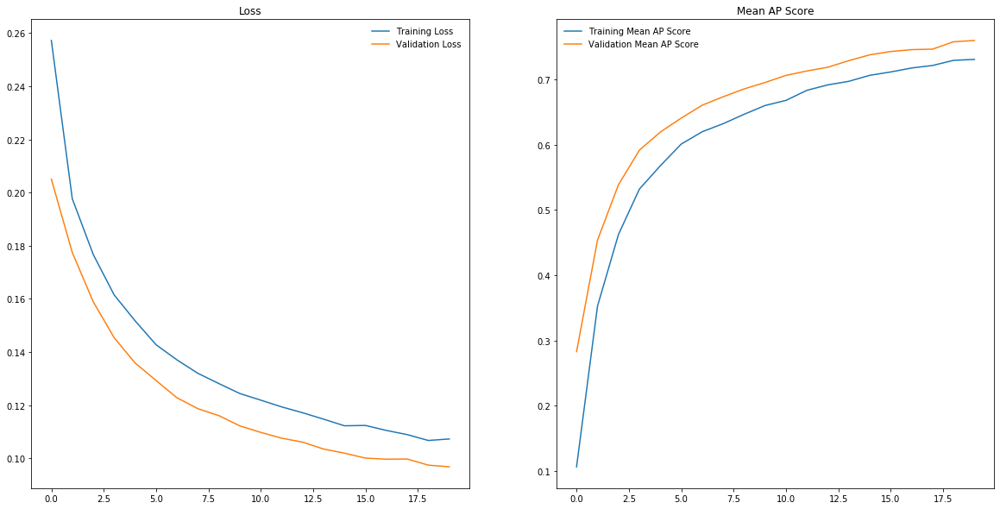

C:\Users\nigel\Anaconda3\envs\humantorch\lib\site-packages\sklearn\metrics\_ranking.py:677: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


Test_Samples: 0/364, Loss: 0.08694874148447357,                Total AP: nan
Test_Samples: 100/364, Loss: 0.07547188707924886,                Total AP: 0.7440
Test_Samples: 200/364, Loss: 0.08884416053904051,                Total AP: 0.7413
Test_Samples: 300/364, Loss: 0.1153200157700695,                Total AP: 0.7441
Test set: Average loss: 0.0981, Total AP: 0.7467
Test set: Classwise AP:
{'aeroplane': 0.9472052262370516,
 'bicycle': 0.7365182551181831,
 'bird': 0.9266977126954841,
 'boat': 0.8026812413257605,
 'bottle': 0.48728558036582253,
 'bus': 0.8740709843921664,
 'car': 0.7375890148086697,
 'cat': 0.9194854280756625,
 'chair': 0.6219962293819851,
 'cow': 0.5462146960377268,
 'diningtable': 0.5688305809514967,
 'dog': 0.8646054374187269,
 'horse': 0.7258124106882182,
 'motorbike': 0.8139545868445677,
 'person': 0.9412183587668003,
 'pottedplant': 0.45712679748249674,
 'sheep': 0.8089782361216121,
 'sofa': 0.4866657355896911,
 'train': 0.9005493274621863,
 'tvmonitor': 0.766476

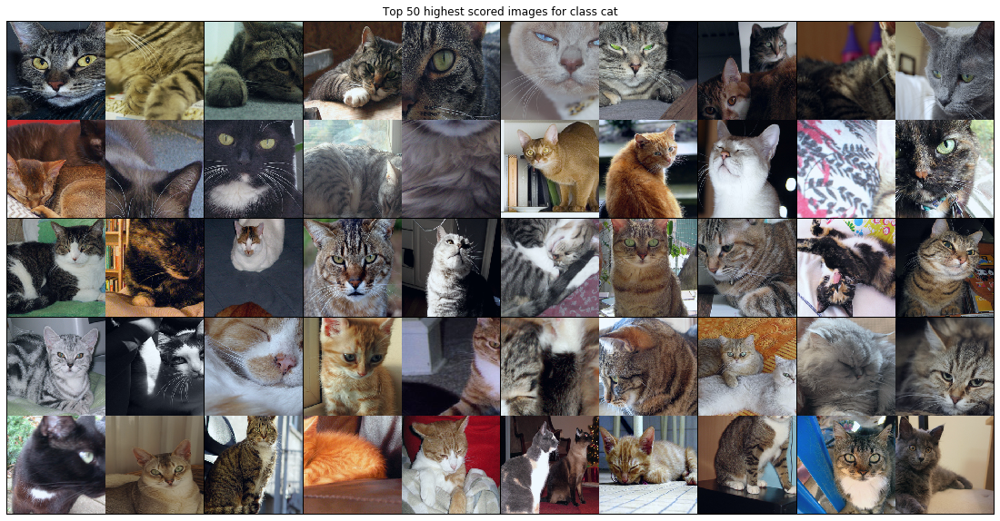

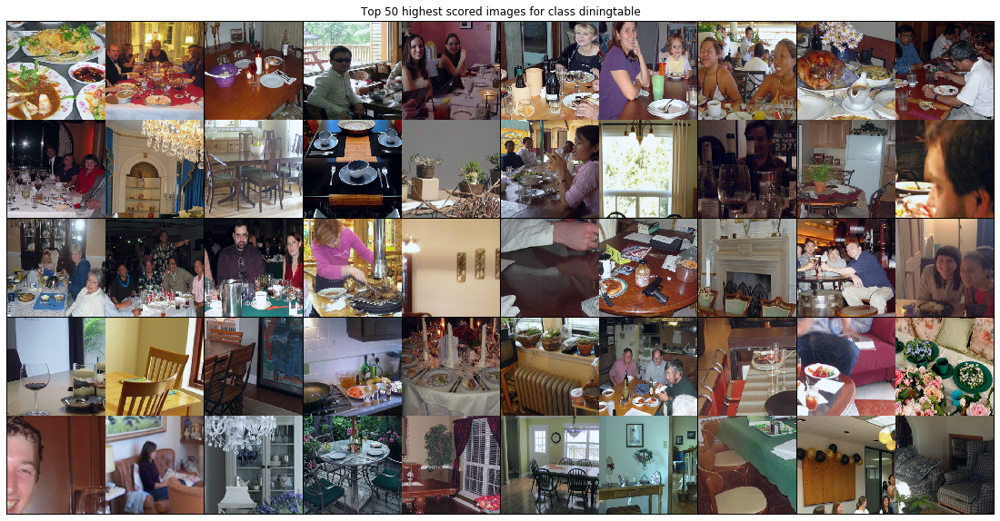

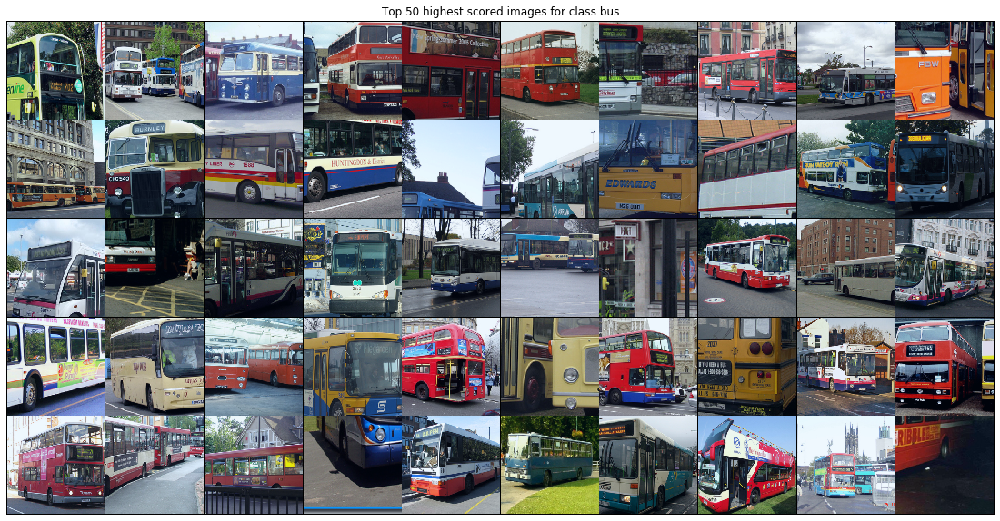

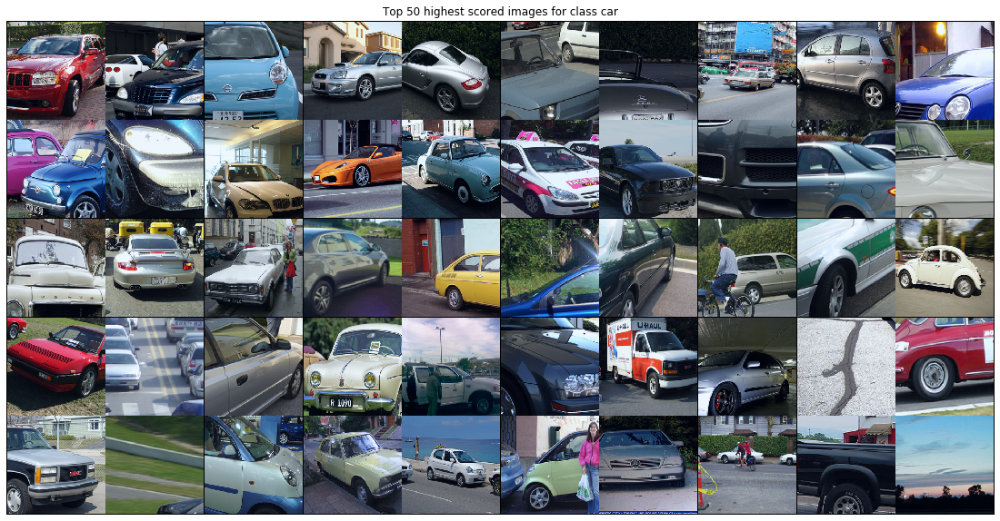

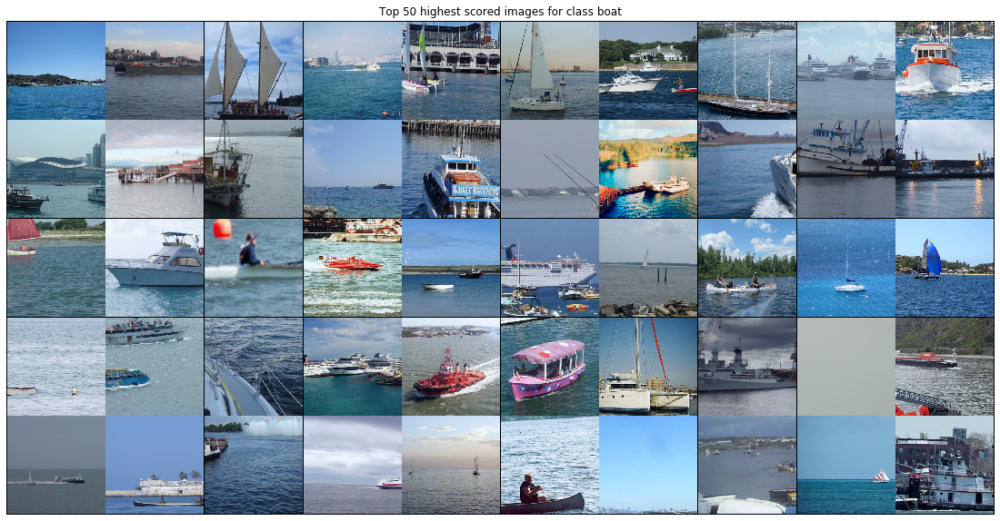

...

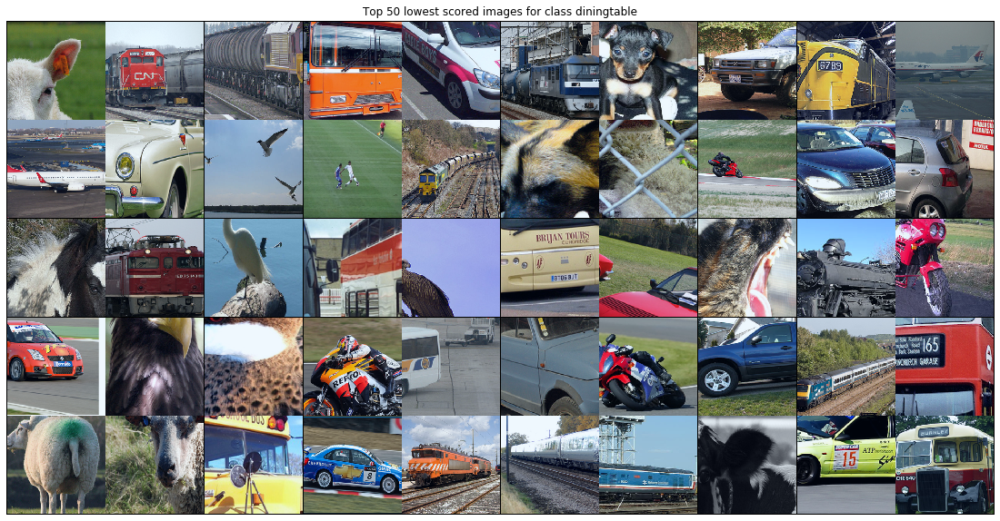

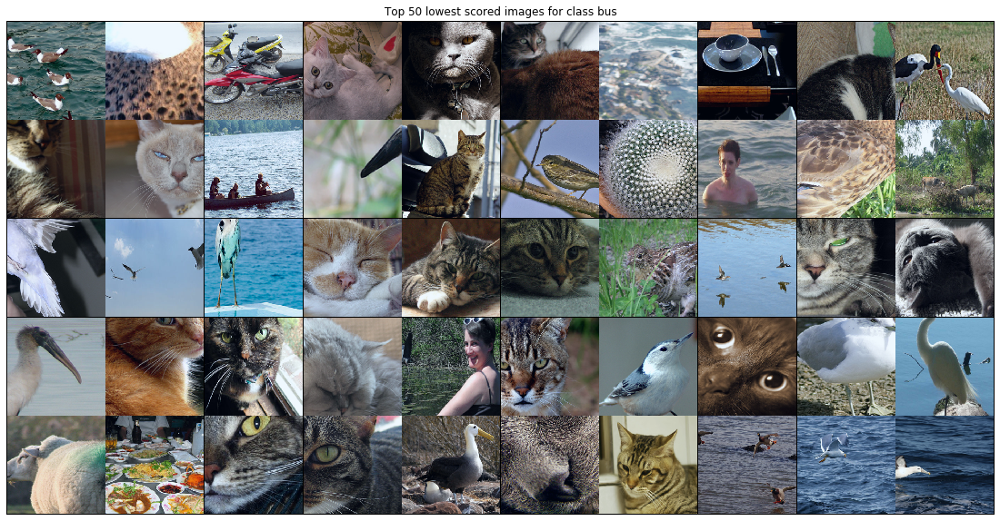

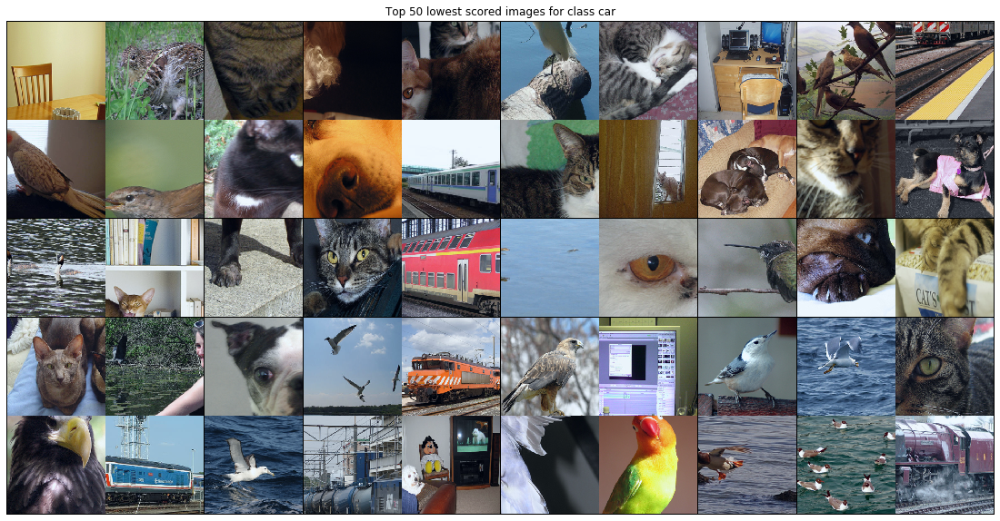

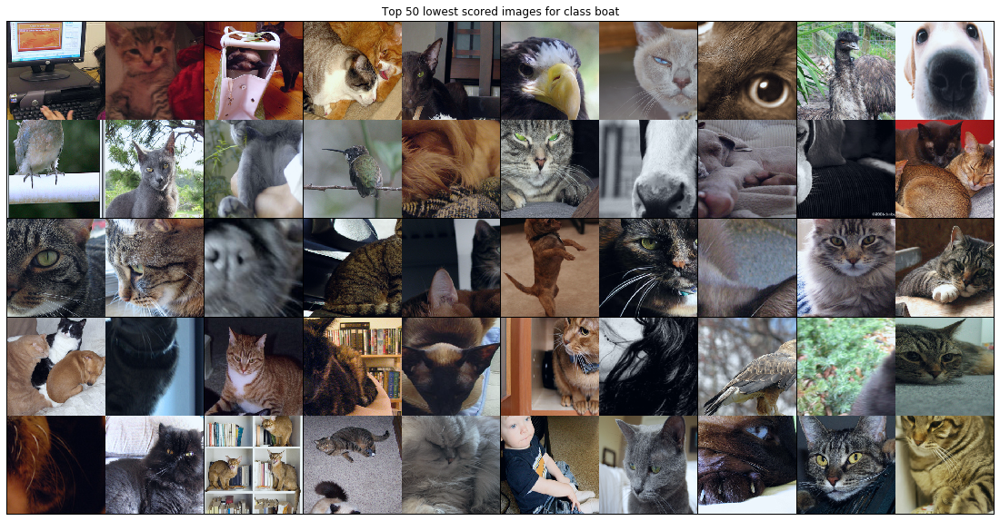

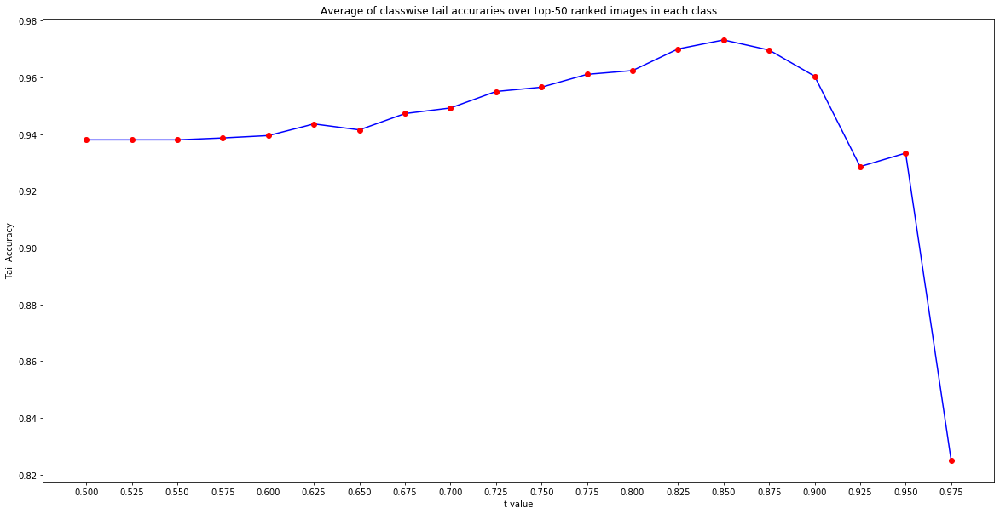

In [13]:
if __name__=='__main__':
    run()